In [1]:
import pandas as pd
import numpy as np
import glob
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
X1 = []
for filename in glob.glob('/Users/laura/Downloads/Hey-Waldo-master/128/notwaldo/*.jpg'):
    im=Image.open(filename)
    X1.append(im)

In [3]:
len(X1)

1317

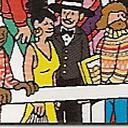

In [4]:
# np.array(X1[0])
X1[0]

In [5]:
y1= np.zeros(len(X1))

In [6]:
X2 = []
for filename in glob.glob('/Users/laura/Downloads/Hey-Waldo-master/128/waldo/*.jpg'):
    im=Image.open(filename)
    X2.append(im)

In [7]:
len(X2)

27

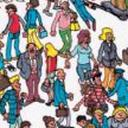

In [8]:
# np.array(X2[0])
X2[0]

In [9]:
y2= np.ones(len(X2))

In [10]:
y = np.concatenate((y1, y2), axis=0)

In [11]:
X = np.concatenate((X1, X2), axis=0)

<__array_function__ internals>:180: FutureWarning: The input object of type 'JpegImageFile' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'JpegImageFile', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


In [12]:
from sklearn.model_selection import train_test_split

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=2)

0.0


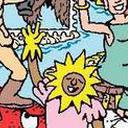

In [15]:
print(y_train[259])
X_train[259]

In [16]:
np.unique(y_train,return_counts=True)

(array([0., 1.]), array([921,  19]))

In [17]:
np.unique(y_test,return_counts=True)

(array([0., 1.]), array([396,   8]))

In [18]:
X_train_n = [np.array(X[x])/255 for x in range(len(X_train))]
X_test_n = [np.array(X[x])/255 for x in range(len(X_test))]

array([[[0.4       , 0.30588235, 0.21176471],
        [0.22352941, 0.03137255, 0.        ],
        [0.70980392, 0.32941176, 0.30588235],
        ...,
        [0.18431373, 0.13333333, 0.06666667],
        [0.15294118, 0.10980392, 0.03921569],
        [0.20392157, 0.16078431, 0.09019608]],

       [[0.45098039, 0.35686275, 0.2627451 ],
        [0.21960784, 0.03137255, 0.        ],
        [0.67058824, 0.29019608, 0.26666667],
        ...,
        [0.15294118, 0.12156863, 0.07058824],
        [0.19607843, 0.16470588, 0.12156863],
        [0.16470588, 0.14117647, 0.09411765]],

       [[0.34901961, 0.24705882, 0.14901961],
        [0.18039216, 0.        , 0.        ],
        [0.63137255, 0.2627451 , 0.23137255],
        ...,
        [0.12941176, 0.13333333, 0.11372549],
        [0.1254902 , 0.13333333, 0.12941176],
        [0.14117647, 0.14901961, 0.14509804]],

       ...,

       [[0.56470588, 0.52941176, 0.53333333],
        [0.56078431, 0.5254902 , 0.52941176],
        [0.61568627, 0

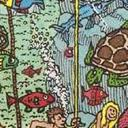

In [19]:
display(X_train_n[0])
display(X_train[0])

In [20]:
from tensorflow.keras import layers, Sequential,metrics
from tensorflow.keras.callbacks import EarlyStopping, LearningRateScheduler

In [21]:
def initialize_model():
    model = Sequential()

    model.add(layers.Conv2D(16, kernel_size=(3, 3), activation='relu',input_shape=X_train_n[0].shape))
    model.add(layers.MaxPool2D(pool_size=(2,2))) 

    model.add(layers.Conv2D(32, kernel_size=(2, 2), activation='relu'))
    model.add(layers.MaxPool2D(pool_size=(2,2)))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(128, kernel_size=(2, 2), activation='relu'))
    model.add(layers.MaxPool2D(pool_size=(2,2))) 
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())

    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.2))
    model.add(layers.Dense(1, activation='sigmoid')) 

    return model

model = initialize_model()

2022-08-30 09:04:45.624083: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [22]:
def compile_model(model,optz='adam'):
#     model.compile(loss='binary_crossentropy',optimizer=optz,metrics='accuracy')
    model.compile(loss='binary_crossentropy',optimizer=optz,metrics=['accuracy',metrics.Recall()])
    return model

In [23]:
model = initialize_model()
model = compile_model(model)
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 63, 63, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 62, 62, 32)        2080      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 31, 31, 32)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 31, 31, 32)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 30, 30, 128)      

In [24]:
np.array(X_train_n).shape

(940, 128, 128, 3)

In [25]:
model = initialize_model()
model = compile_model(model,'adam')
# callback = EarlyStopping(monitor='val_accuracy', patience=30,mode='max', restore_best_weights=True)
# callback2 = LearningRateScheduler(cosine_annealing)
# callback2 = LearningRateScheduler(scheduler) #Logaritmic scheduler
# callback2 = LearningRateScheduler(scheduler2) # normal and constant learning rate of 0.01
history = model.fit(np.array(X_train_n),
                    y_train,
                    validation_split=0.3,
                    batch_size=256,
                    epochs=5,verbose=1)#,
#                     callbacks=[callback,callback2])

Epoch 1/5
3/3 [==============================] - 4s 998ms/step - loss: 0.3992 - accuracy: 0.8860 - recall_1: 0.1667 - val_loss: 0.3888 - val_accuracy: 0.9752 - val_recall_1: 0.0000e+00
Epoch 2/5
3/3 [==============================] - 3s 947ms/step - loss: 0.4573 - accuracy: 0.9818 - recall_1: 0.0000e+00 - val_loss: 0.2733 - val_accuracy: 0.9752 - val_recall_1: 0.0000e+00
Epoch 3/5
3/3 [==============================] - 3s 894ms/step - loss: 0.3037 - accuracy: 0.9818 - recall_1: 0.0000e+00 - val_loss: 0.1408 - val_accuracy: 0.9752 - val_recall_1: 0.0000e+00
Epoch 4/5
3/3 [==============================] - 3s 923ms/step - loss: 0.1720 - accuracy: 0.9818 - recall_1: 0.0000e+00 - val_loss: 0.1798 - val_accuracy: 0.9752 - val_recall_1: 0.0000e+00
Epoch 5/5
3/3 [==============================] - 3s 1s/step - loss: 0.1068 - accuracy: 0.9818 - recall_1: 0.0000e+00 - val_loss: 0.3748 - val_accuracy: 0.9752 - val_recall_1: 0.0000e+00


In [26]:
model.evaluate(np.array(X_test_n),y_test)

13/13 [==============================] - 1s 39ms/step - loss: 0.4163 - accuracy: 0.9802 - recall_1: 0.0000e+00


[0.41634422540664673, 0.9801980257034302, 0.0]

In [27]:
np.unique(y_test,return_counts=True)

(array([0., 1.]), array([396,   8]))

everything is predicted as not wally

In [28]:
from imblearn.over_sampling import SMOTE 

In [29]:
X2 = np.array([np.array(X[x])/255 for x in range(len(X))])

In [30]:
X2.shape

(1344, 128, 128, 3)

In [31]:
ReX  = X2.reshape(X2.shape[0],128*128*3)
smt = SMOTE()
Xsm, ysm = smt.fit_resample(ReX, y)

In [32]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(Xsm, ysm, test_size=0.3, random_state=2)

In [33]:
np.unique(y_train2,return_counts=True)

(array([0., 1.]), array([929, 914]))

1.0


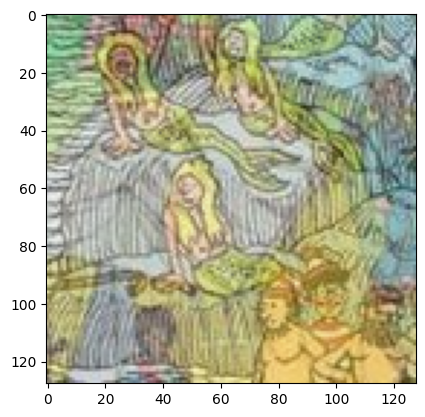

In [39]:
print(y_train2[1100])
plt.imshow(X_train2[1100].reshape(128,128,3))

In [41]:
temp = pd.DataFrame(y_train2)
temp[temp[0]==1].index[0:20]

Int64Index([1, 2, 6, 9, 10, 11, 12, 14, 15, 22, 23, 24, 26, 27, 28, 32, 33, 34,
            36, 38],
           dtype='int64')

1.0


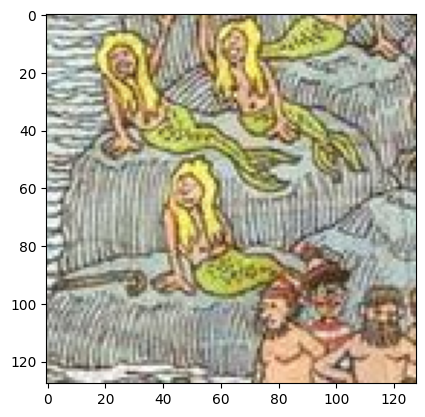

In [47]:
print(y_train2[26])
plt.imshow(X_train2[26].reshape(128,128,3))

In [48]:
X_train2.shape

(1843, 49152)

check why im doing this for the 1843 images

In [49]:
X_train2 = X_train2.reshape(1843,128,128,3)

In [50]:
model = initialize_model()
model = compile_model(model,'adam')
history = model.fit(X_train2,
                    y_train2,
                    validation_split=0.3,
                    batch_size=128,
                    epochs=20,verbose=1)#,

Epoch 1/20
11/11 [==============================] - 7s 517ms/step - loss: 1.0455 - accuracy: 0.5256 - recall_2: 0.5341 - val_loss: 0.6864 - val_accuracy: 0.8336 - val_recall_2: 0.8375
Epoch 2/20
11/11 [==============================] - 5s 479ms/step - loss: 0.6738 - accuracy: 0.5535 - recall_2: 0.2203 - val_loss: 0.6830 - val_accuracy: 0.5371 - val_recall_2: 1.0000
Epoch 3/20
11/11 [==============================] - 5s 486ms/step - loss: 0.6476 - accuracy: 0.6674 - recall_2: 0.5182 - val_loss: 0.6519 - val_accuracy: 0.6420 - val_recall_2: 0.9823
Epoch 4/20
11/11 [==============================] - 5s 494ms/step - loss: 0.5357 - accuracy: 0.8016 - recall_2: 0.8193 - val_loss: 0.4971 - val_accuracy: 0.7776 - val_recall_2: 0.9187
Epoch 5/20
11/11 [==============================] - 5s 487ms/step - loss: 0.4475 - accuracy: 0.8240 - recall_2: 0.8653 - val_loss: 0.4270 - val_accuracy: 0.8373 - val_recall_2: 0.8905
Epoch 6/20
11/11 [==============================] - 5s 500ms/step - loss: 0.4017

In [51]:
X_test2 = X_test2.reshape(len(y_test2),128,128,3)

In [52]:
model.evaluate(X_test2,y_test2)

25/25 [==============================] - 1s 41ms/step - loss: 0.0568 - accuracy: 0.9836 - recall_2: 1.0000


[0.05679028108716011, 0.983565092086792, 1.0]

In [ ]:
# np.unique(y_test2,return_counts=True)
# y_test2

try to predict

In [53]:
predict_input = []
for filename in glob.glob('/Users/laura/Downloads/2_Waldo_Illustration.png'):
    pr=Image.open(filename)
    predict_input.append(pr)

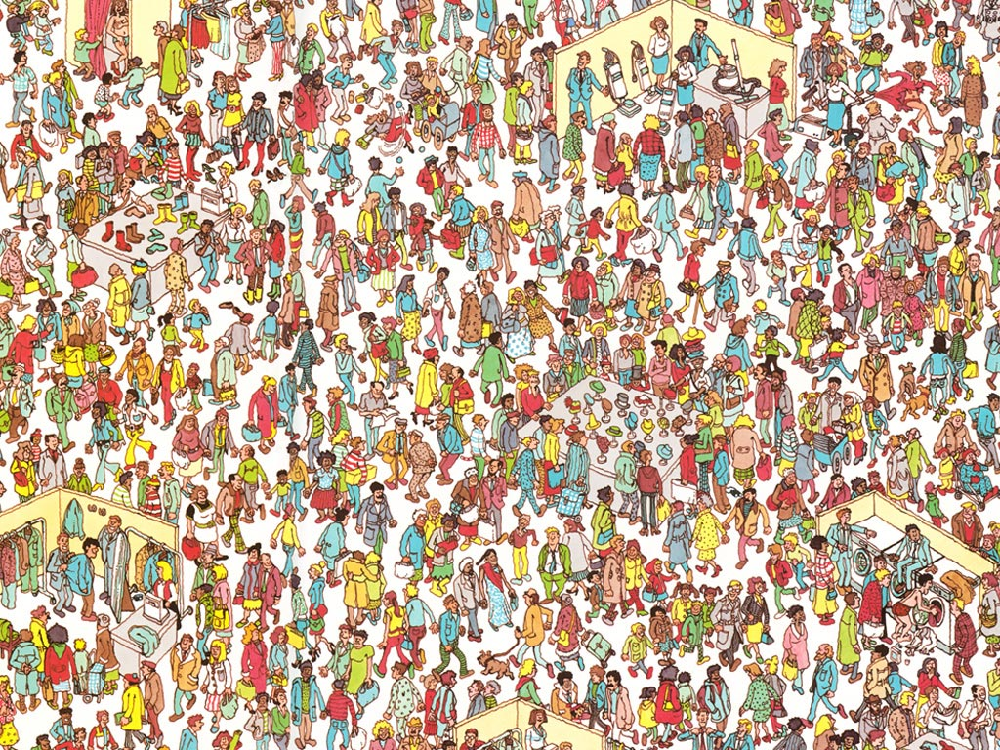

In [54]:
predict_input[0]

In [55]:
temp = np.array(predict_input[0])

In [56]:
temp.shape

(768, 1024, 3)

In [57]:
M = 128
N = 128
tiles = [temp[x:x+M,y:y+N] for x in range(0,temp.shape[0],M) for y in range(0,temp.shape[1],N)]

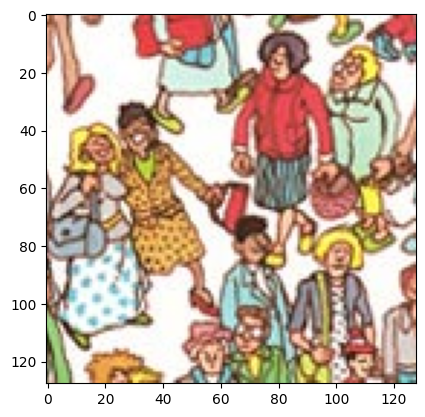

In [59]:
plt.imshow(tiles[20])

In [60]:
X_predict = np.array([np.array(tiles[x])/255 for x in range(len(tiles))])

In [61]:
temp = model.predict(X_predict)

2/2 [==============================] - 0s 32ms/step


In [62]:
temp

array([[0.01891981],
       [0.00601284],
       [0.13570903],
       [0.073948  ],
       [0.13729674],
       [0.04268393],
       [0.02120774],
       [0.03995014],
       [0.35388097],
       [0.01082456],
       [0.00436393],
       [0.01320744],
       [0.3494399 ],
       [0.01273036],
       [0.08192712],
       [0.00525968],
       [0.06267591],
       [0.3952995 ],
       [0.04429211],
       [0.228285  ],
       [0.00880667],
       [0.13770631],
       [0.03640691],
       [0.00944739],
       [0.01443208],
       [0.3086338 ],
       [0.01189645],
       [0.00846992],
       [0.02551747],
       [0.01607617],
       [0.00865217],
       [0.00367904],
       [0.00824006],
       [0.01200858],
       [0.0707323 ],
       [0.08972982],
       [0.11917258],
       [0.00924934],
       [0.05993687],
       [0.25257513],
       [0.02791617],
       [0.03195801],
       [0.67185915],
       [0.01135918],
       [0.8838597 ],
       [0.00451683],
       [0.00108595],
       [0.074

In [66]:
temp2 = pd.DataFrame(temp)>=0.4
temp2[temp2[0]==True]

,0
42,True
44,True


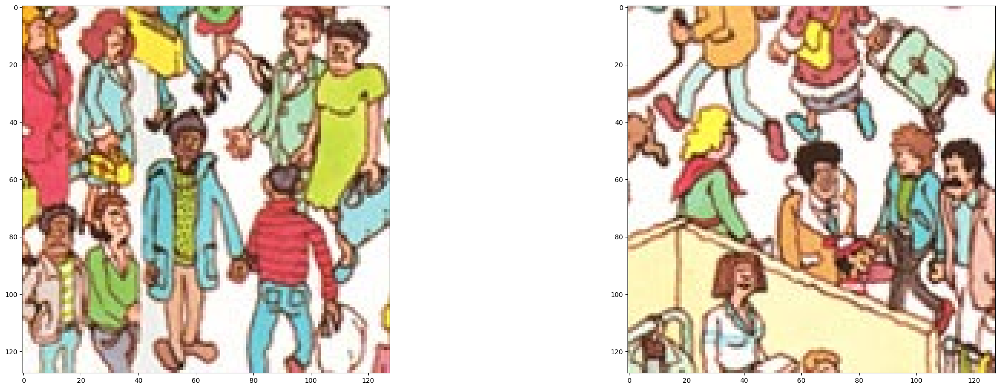

In [67]:
fig , axes = plt.subplots(1,2,figsize=(30,10))
axes[0].imshow(tiles[42])
axes[1].imshow(tiles[44])
# axes[2].imshow(tiles[38])

second try to predict

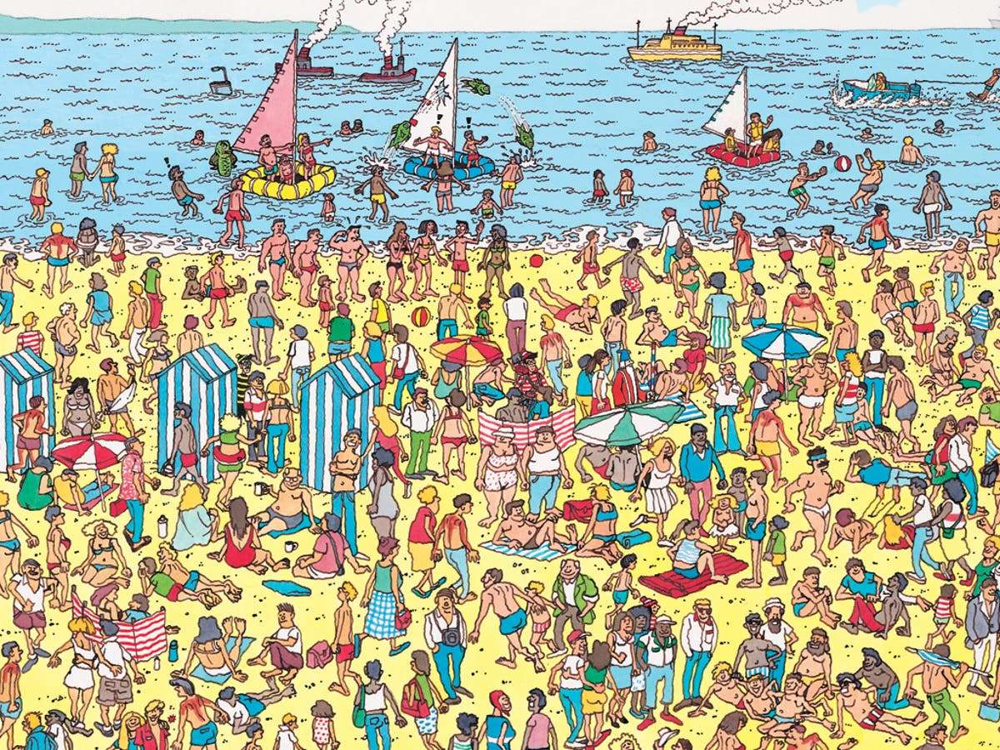

In [68]:
predict_input = []
for filename in glob.glob('/Users/laura/Downloads/original.jpg'):
    pr=Image.open(filename)
    predict_input.append(pr)
predict_input[0]

In [70]:
temp = np.array(predict_input[0])
print(temp.shape)
print(temp.shape[0]%128)
print(temp.shape[1]%128)

(900, 1200, 3)
4
48


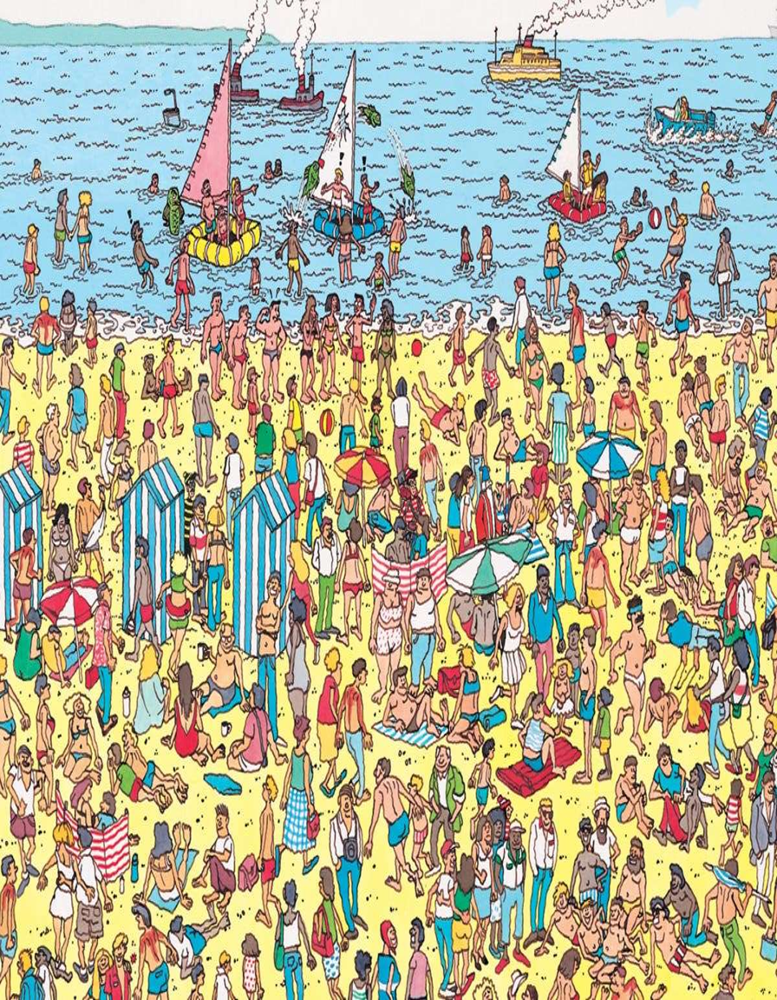

In [71]:
temp_resized = predict_input[0].resize((896, 1152))
temp_resized

In [72]:
temp = np.array(temp_resized)
M = 128
N = 128
tiles = [temp[x:x+M,y:y+N] for x in range(0,temp.shape[0],M) for y in range(0,temp.shape[1],N)]
# print(len(tiles))
# plt.imshow(tiles[9])
X_predict = np.array([np.array(tiles[x])/255 for x in range(len(tiles))])

In [73]:
temp = model.predict(X_predict)

2/2 [==============================] - 0s 57ms/step


In [74]:
temp2 = pd.DataFrame(temp)>=0.8
temp2[temp2[0]==True]

,0
43,True
62,True


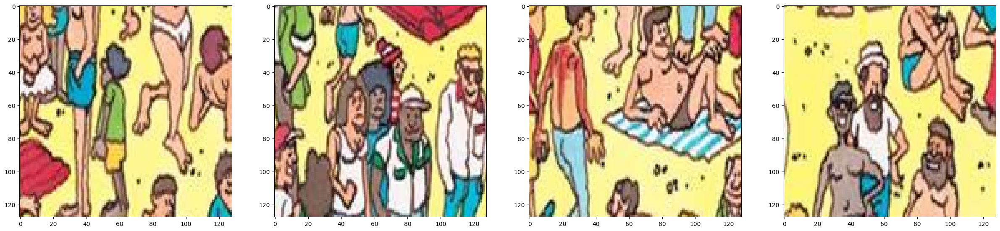

In [83]:
fig , axes = plt.subplots(1,4,figsize=(30,10))
axes[0].imshow(tiles[47])
axes[1].imshow(tiles[53])
axes[2].imshow(tiles[45])
axes[3].imshow(tiles[54])

In [82]:
temp2 = pd.DataFrame(temp)>=0.3
temp2[temp2[0]==True]

,0
43,True
45,True
47,True
53,True
54,True
62,True
